<h1 align="center">Taller Geofísica Refracción sísmica</h1>


<h2 align="center"> Sara Paulina Pamplona Giraldo </h2>
<h2 align="center"> Luisa Maria Sanchez Gallego </h2>
<h2 align="center">2024-1</h2>

<h3> Punto 1 </h3>

<ul>
    <li><h4> Importar librerias necesarias para el código </h4></li>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress
import math
from IPython.display import display, HTML
from IPython.display import Image
from IPython.display import display, Math
import numpy as np

<ul>
    <li><h4> Se defienen los datos observados en las gráficas proporcionadas</h4></li>

In [2]:
datos_X = [5, 15, 25, 35, 45, 55, 65, 75, 85, 95, 105, 115]

In [3]:
datos_T = [23, 33, 40, 46, 53, 60, 65, 70, 72, 75, 78, 80]

<ul>
    <li><h4> Se ordenan los datos en una tabla </h4></li>

In [4]:
df = pd.DataFrame({'X': datos_X, 'T': datos_T})
print(df)

      X   T
0     5  23
1    15  33
2    25  40
3    35  46
4    45  53
5    55  60
6    65  65
7    75  70
8    85  72
9    95  75
10  105  78
11  115  80


<ul>
    <li><h4> Se realiza el gráfico correspondiente a los valores experimentales </h4></li>

(0.0, 82.85)

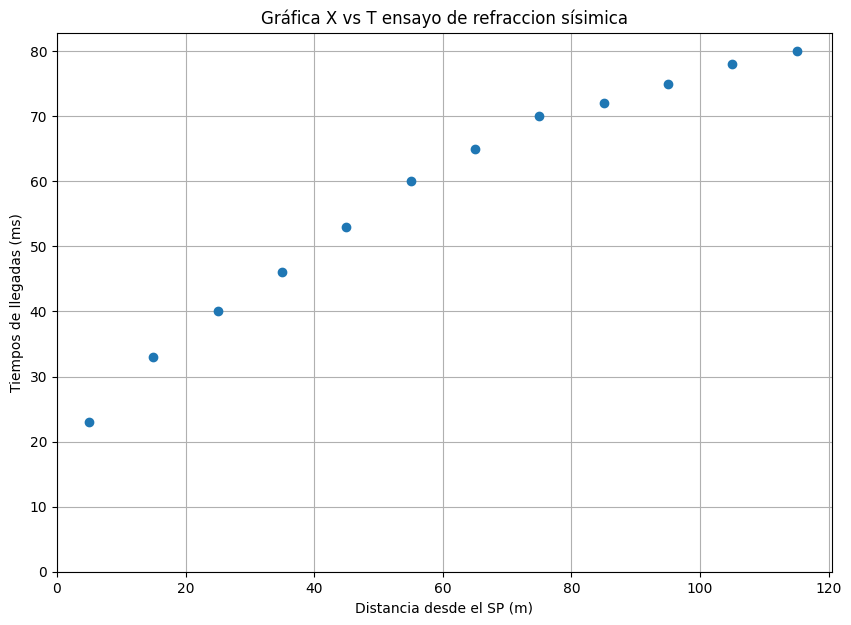

In [5]:
plt.figure(figsize=(10,7))
plt.plot(df['X'], df['T'], 'o')
plt.title('Gráfica X vs T ensayo de refraccion sísimica')
plt.xlabel('Distancia desde el SP (m)')
plt.ylabel('Tiempos de llegadas (ms)')
plt.grid(True)
plt.xlim(left=0)
plt.ylim(bottom=0)

<ul>
    <li><h4> Se realizan las regresiones lineales y se genera la gráfica representativa</h4></li>

(0.0, 83.06)

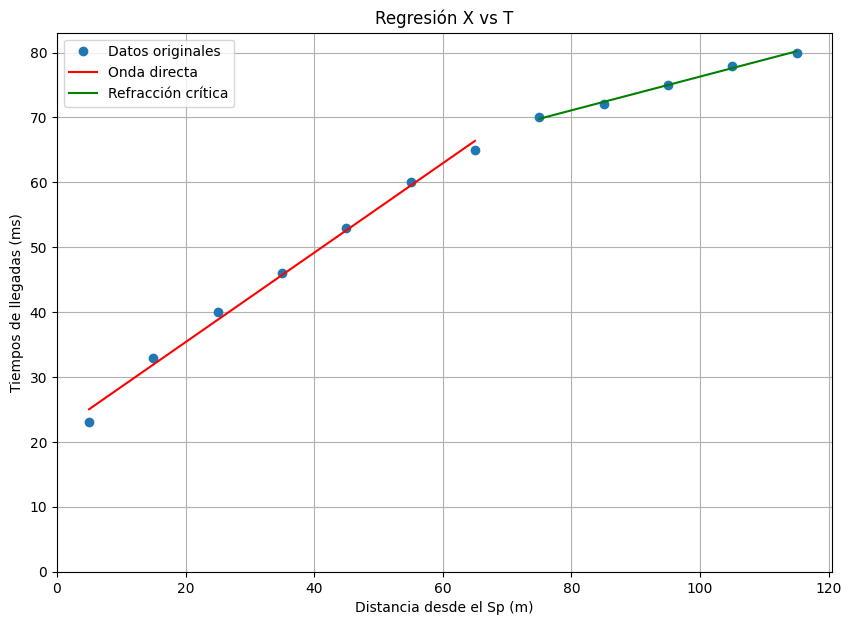

In [6]:
intervalo_1 = (0,6)
intervalo_2 = (7, 11)
datos_intervalo_1 = df.iloc[intervalo_1[0]:intervalo_1[1]+1]
datos_intervalo_2 = df.iloc[intervalo_2[0]:intervalo_2[1]+1]
slope_1, intercept_1, r_value, p_value, std_err = linregress(datos_intervalo_1['X'], datos_intervalo_1['T'])
slope_2, intercept_2, r_value, p_value, std_err = linregress(datos_intervalo_2['X'], datos_intervalo_2['T'])
plt.figure(figsize = (10,7))
plt.plot(df['X'], df['T'], 'o', label='Datos originales')
plt.plot(datos_intervalo_1['X'], slope_1 * datos_intervalo_1['X']+ intercept_1, 'r-', label='Onda directa')
plt.plot(datos_intervalo_2['X'], slope_2 * datos_intervalo_2['X'] + intercept_2, 'g-', label='Refracción crítica')
plt.title('Regresión X vs T')
plt.xlabel('Distancia desde el Sp (m)')
plt.ylabel('Tiempos de llegadas (ms)')
plt.legend()
plt.grid(True)
plt.xlim(left=0)
plt.ylim(bottom=0)

<ul>
    <li><h4> Finalmente se calculan las velocidades y el espesor del estrato </h4></li>

In [7]:
V2= 1/(slope_2)
V1= 1/(slope_1)
ic = math.asin(V1/V2)
Cosic = math.cos(ic)
h1=(intercept_2*V1)/2*Cosic
ic_grados = math.degrees(ic)
X0 = intercept_2/((1)-(V1/V2))
mensaje_html = f'''
<div style="color: black; font-size: 16px; font-weight: bold;">
    <p>El espesor del estrato es {h1:.2f} m</p>
    <p>La velocidad del estrato 1 es {V1:.2f} m/ms</p>
    <p>La velocidad del estrato 2 es {V2:.2f} m/ms</p>
    <p>El ángulo de incidencia es {ic_grados:.2f}º</p>
    <p>La distancia cross-over es {X0:.2f}m</p>
</div>
'''
display(HTML(mensaje_html))


<ul>
    <li><h4> Se muestra un esquema representatitivo de los resultados</li></h4>

In [ ]:
Image(filename="D:\\Respaldo\\2024-1\\GEOFISICA\\geofisica1v6.jpg")

<h3> Punto 2 </h3>

<ul>
    <li><h4> Se definen los datos dados y se agrega una columna de la Distancia en contraperfil para la correcta realización del gráfico </li></h4>

In [ ]:
datos = {'Distancia':[5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100,105,110,115,120],
         'Perfil':[8.6,12.9,21,27.6,36.8,41.9,49.8,52.2,53.2,54.6,57.6,61.4,64,65.9,67.8,70.6,74.2,75,78.4,78,78.6,79.3,80.9,82.5],
         'Contraperfil':[6.7,15.8,17.7,22.8,26.7,29.9,33.3,36,37.8,42.8,46.7,49.8,51.5,56.3,60.1,63.5,65.6,68.1,74.2,75.9,78.8,80,79.4,80.9]}
df = pd.DataFrame(datos)
df['Dcontraperfil'] = [max(df['Distancia'])+5 - x for x in df['Distancia']]
df = df.round(1)
print(df)

    Distancia  Perfil  Contraperfil  Dcontraperfil
0           5     8.6           6.7            120
1          10    12.9          15.8            115
2          15    21.0          17.7            110
3          20    27.6          22.8            105
4          25    36.8          26.7            100
5          30    41.9          29.9             95
6          35    49.8          33.3             90
7          40    52.2          36.0             85
8          45    53.2          37.8             80
9          50    54.6          42.8             75
10         55    57.6          46.7             70
11         60    61.4          49.8             65
12         65    64.0          51.5             60
13         70    65.9          56.3             55
14         75    67.8          60.1             50
15         80    70.6          63.5             45
16         85    74.2          65.6             40
17         90    75.0          68.1             35
18         95    78.4          

<ul>
    <li><h4>Se realiza el gráfico de nube de puntos de los datos administrados, diferenciando por datos en perfil (azul) y datos en contraperfil (rojo) </li></h4>

(0.0, 86.29)

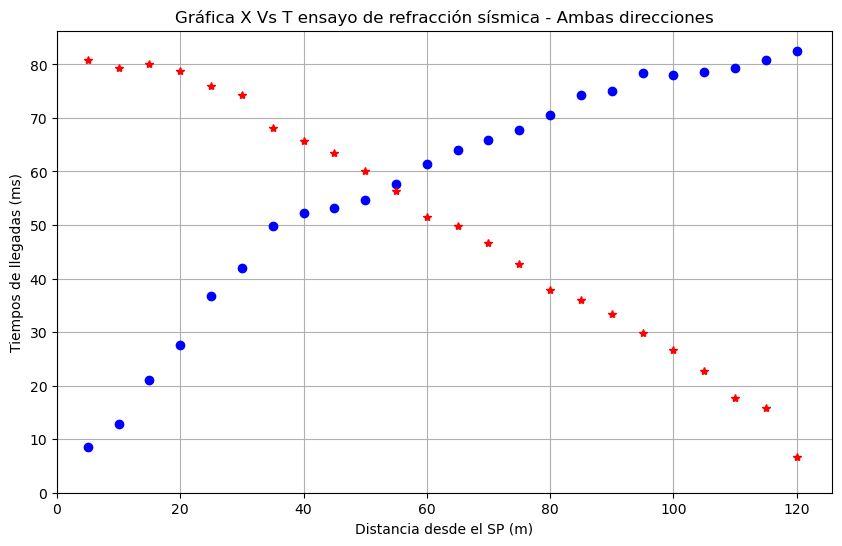

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(df['Distancia'], df['Perfil'], 'o', color='blue')
plt.plot(df['Dcontraperfil'],df['Contraperfil'], '*',color='red')
plt.title('Gráfica X Vs T ensayo de refracción sísmica - Ambas direcciones')
plt.xlabel('Distancia desde el SP (m)')
plt.ylabel('Tiempos de llegadas (ms)')
plt.grid(True)
plt.xlim(left=0)
plt.ylim(bottom=0)

:<ul>
    <li><h4> Se realizan las regresiones lineales y se genera la gráfica representativa</h4></li>

(0.0, 86.29)

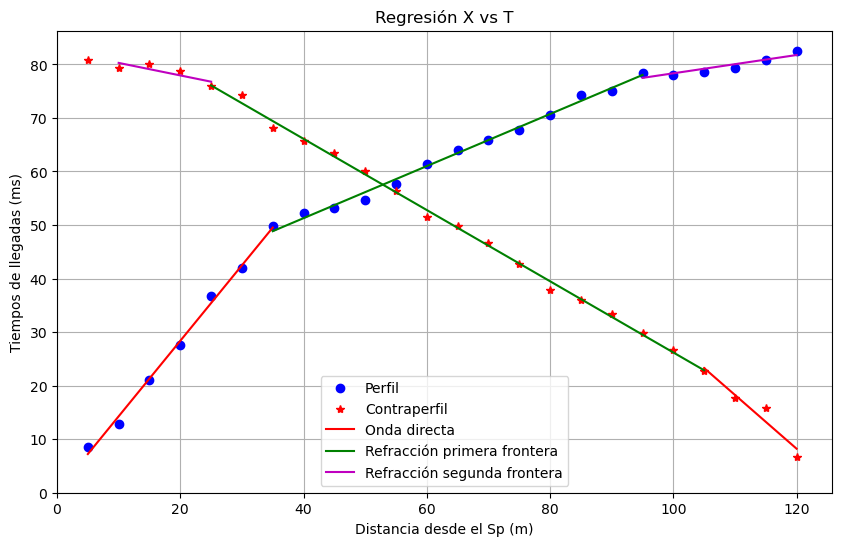

In [ ]:
intP_1 = (0,6)
intP_2 = (6, 18)
intP_3 = (18,23)
intC_1 = list(range(0,4))
intC_2 = list(range(3,20))
intC_3 = list(range(19,23))
Columnas = ['Contraperfil','Dcontraperfil']
Colcal = ['Contraperfil','Distancia']
DinterP_1 = df.iloc[intP_1[0]:intP_1[1]+1]
DinterP_2 = df.iloc[intP_2[0]:intP_2[1]+1]
DinterP_3 = df.iloc[intP_3[0]:intP_3[1]+1]
Dinter_cal2 = df.iloc[intC_2, df.columns.isin(Colcal)]
Dinter_cal3 = df.iloc[intC_3, df.columns.isin(Colcal)]
DinterC_1 = df.iloc[intC_1, df.columns.isin(Columnas)]
DinterC_2 = df.iloc[intC_2, df.columns.isin(Columnas)]
DinterC_3 = df.iloc[intC_3, df.columns.isin(Columnas)]
slope_1P, intercept_1P, r_value, p_value, std_err = linregress(DinterP_1['Distancia'], DinterP_1['Perfil'])
slope_2P, intercept_2P, r_value, p_value, std_err = linregress(DinterP_2['Distancia'], DinterP_2['Perfil'])
slope_3P, intercept_3P, r_value, p_value, std_err = linregress(DinterP_3['Distancia'], DinterP_3['Perfil'])
slope_1C, intercept_1C, r_value, p_value, std_err = linregress(DinterC_1['Dcontraperfil'], DinterC_1['Contraperfil'])
slope_2C, intercept_2C, r_value, p_value, std_err = linregress(DinterC_2['Dcontraperfil'], DinterC_2['Contraperfil'])
slope_3C, intercept_3C, r_value, p_value, std_err = linregress(DinterC_3['Dcontraperfil'], DinterC_3['Contraperfil'])
slope_3Cal, intercept_3Cal, r_value, p_value, std_err = linregress(Dinter_cal3['Distancia'], DinterC_3['Contraperfil'])
plt.figure(figsize = (10,6))
plt.plot(df['Distancia'], df['Perfil'], 'o', color='blue', label='Perfil')
plt.plot(df['Dcontraperfil'],df['Contraperfil'], '*',color='red', label = 'Contraperfil')
plt.plot(DinterP_1['Distancia'], slope_1P * DinterP_1['Distancia']+ intercept_1P, 'r-', label='Onda directa')
plt.plot(DinterP_2['Distancia'], slope_2P * DinterP_2['Distancia'] + intercept_2P, 'g-', label='Refracción primera frontera')
plt.plot(DinterP_3['Distancia'], slope_3P * DinterP_3['Distancia'] + intercept_3P, 'm-', label='Refracción segunda frontera')
plt.plot(DinterC_1['Dcontraperfil'], slope_1C * DinterC_1['Dcontraperfil']+ intercept_1C, 'r-',)
plt.plot(DinterC_2['Dcontraperfil'], slope_2C * DinterC_2['Dcontraperfil'] + intercept_2C, 'g-',)
plt.plot(DinterC_3['Dcontraperfil'], slope_3C * DinterC_3['Dcontraperfil'] + intercept_3C, 'm-',)
plt.title('Regresión X vs T')
plt.xlabel('Distancia desde el Sp (m)')
plt.ylabel('Tiempos de llegadas (ms)')
plt.legend()
plt.grid(True)
plt.xlim(left=0)
plt.ylim(bottom=0)

<ul>
    <li><h3>A partir del esquema, se pueden observar 3 capas, con buzamiento, debido al comportamiento asimétrico del gráfico. Además, se conoce que buzan hacia la izquierda debido a que el rayo directo en sentido contraperfil (derecha a izquierda) llega más rápido que el rayo directo en sentido perfil </li></h3>

In [ ]:
V1 = 1/abs(slope_1C)
i11 = (1/2)*(math.degrees(math.asin(V1/(1/slope_2P)))+math.degrees(math.asin(V1/abs(1/slope_2C))))
V2 = V1/(math.sin(math.radians(i11)))
i22 = (1/2)*(math.degrees(math.asin(V2/(1/slope_3P)))+math.degrees(math.asin(V2/abs(1/slope_3C))))
V3 = V2/(math.sin(math.radians(i22)))
i12 = math.degrees(math.asin (V1/V3))
Theta = (math.degrees(math.asin(V1*abs(slope_2C))))-i11
h1P=(intercept_2P*V1)/(2*math.cos(math.radians(i11)))
h1= h1P - (120*math.sin(math.radians(Theta)))
h2= (V2/(2*math.cos(math.radians(i12))))*(intercept_3Cal-((2*h1P*math.cos(math.radians(i22)))/V1))
mensaje_html = f'''
<div style="color: black; font-size: 16px; font-weight: bold;">
    <p>El espesor del estrato 1 en su parte más ancha es: {h1P:.2f} m</p>
    <p>El espesor del estrato 1 en su parte más angosta: {h1:.2f} m/ms</p>
    <p>El espesor del estrato 2 es de: {h2:.2f} m/ms</p>
    <p>La velocidad del estrato 1 es: {V1:.2f}º</p>
    <p>La velocidad del estrato 2 es: {V2:.2f}m</p>
    <p>La velocidad del estrato 3 es: {V3:.2f}m</p>
    <p>El ángulo de buzamiento es: {Theta:.2f}º</p>
    <p>El ángulo de incidencia en la frontera 1 que se refractacriticamente en esta es: {i11:.2f}º</p>
    <p>El ángulo de incidencia en la frontera 1 que se refracta criticamente en la segunda frontera es: {i12:.2f}º</p>
    <p>El ángulo de incidencia en la frontera 2 que se refractacriticamente en esta es: {i22:.2f}º</p>
</div>
'''
display(HTML(mensaje_html))

<ul>
    <li><h3>Se presenta un esquema representativo de los resultados obtenidos</li></h3>

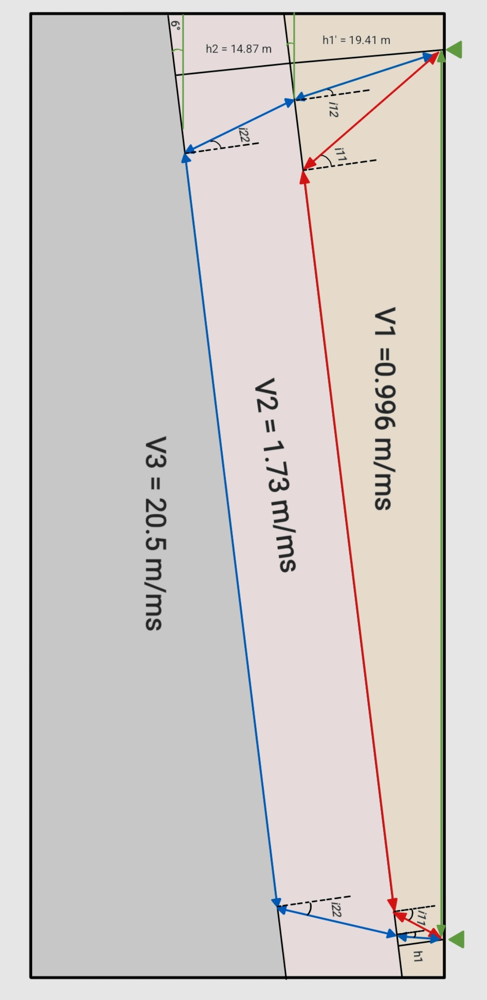

In [ ]:
Image(filename="D:\descargas\Geofisica_T1_P2.jpg")

<h3> Punto 3 </h3>

<ul>
    <li><h4>Se definen los datos, se halla hp' y los ángulos de incidencia para realizar los cálculos posteriores</h4></li>

In [8]:
V1,V2,V3 = 0.85,1.25,1.8
h1,h2 = 8, 11
Theta = math.radians(11)
h1p = h1 + 230*math.sin(math.radians(11))
i11 = math.asin(V1/V2)
i12 = math.asin (V1/V3)
i22 =math.asin(V2/V3)
print ('La ecuación de tiempo de viaje para fronteras inclinadas, esta definida por:')
latex_str = r"""
t = \left( \frac{X}{V_1} \right) \sin \left( i_{ik} \pm \theta \right) + \sum_{j=1}^{k} \left( \frac{2h_j \cos \left( i_{jk} \right)}{V_k} \right)
"""
display(Math(latex_str))

La ecuación de tiempo de viaje para fronteras inclinadas, esta definida por:


<IPython.core.display.Math object>

<ul>
    <li><h4>Definir las ecuaciones de tiempo de viaje para "Down-Dip"</h4></li>

In [9]:
def funcion_OdirectaD(x):
    return (1/V1) * x
print ('Tiempo para el rayo directo')
latex_str = r"t = \frac{x}{V_1}"
display(Math(latex_str))
def funcion_Critica_1D(x):
    return ((1/V1)*math.sin(i11+Theta))*x + ((2*h1*math.cos(i11))/V1)
print ('Tiempo para el rayo refractado críticamente en la frontera 1')
latex_str = r"t = \left(\frac{\sin(i_{11} + \theta)}{V_1}\right) x + \frac{2h_1'\cos(i_{11})}{V_1}"
display(Math(latex_str))
def funcion_Critica_2D(x):
    return ((1/V1)*math.sin(i12+Theta))*x + ((2*h1*math.cos(i12))/V1) + ((2*h2*math.cos(i22))/V2)
print ('Tiempo para el rayo refractado críticamente en la frontera 2')
latex_str = r"t = \left(\frac{\sin(i_{12} + \theta)}{V_1}\right) x + \frac{2h_1'\cos(i_{12})}{V_1} + \frac{2h_2\cos(i_{22})}{V_2}"
display(Math(latex_str))

Tiempo para el rayo directo


<IPython.core.display.Math object>

Tiempo para el rayo refractado críticamente en la frontera 1


<IPython.core.display.Math object>

Tiempo para el rayo refractado críticamente en la frontera 2


<IPython.core.display.Math object>

<ul>
    <li><h4>Definir las ecuaciones de tiempo de viaje para "Up-Dip"</h4></li>

In [10]:
def funcion_OdirectaU(x):
    return (1/V1) * x
print ('Tiempo para el rayo directo')
latex_str = r"t = \frac{x}{V_1}"
display(Math(latex_str))
def funcion_Critica_1U(x):
    return ((1/V1)*math.sin(i11-Theta))*x + ((2*h1p*math.cos(i11))/V1)
print ('Tiempo para el rayo refractado críticamente en la frontera 1')
latex_str = r"t = \left(\frac{\sin(i_{11} - \theta)}{V_1}\right) x + \frac{2h_1'\cos(i_{11})}{V_1}"
display(Math(latex_str))
def funcion_Critica_2U(x):
    return ((1/V1)*math.sin(i12-Theta))*x + ((2*h1p*math.cos(i12))/V1) + ((2*h2*math.cos(i22))/V2)
print ('Tiempo para el rayo refractado críticamente en la frontera 2')
latex_str = r"t = \left(\frac{\sin(i_{12} - \theta)}{V_1}\right) x + \frac{2h_1'\cos(i_{12})}{V_1} + \frac{2h_2\cos(i_{22})}{V_2}"
display(Math(latex_str))

Tiempo para el rayo directo


<IPython.core.display.Math object>

Tiempo para el rayo refractado críticamente en la frontera 1


<IPython.core.display.Math object>

Tiempo para el rayo refractado críticamente en la frontera 2


<IPython.core.display.Math object>

<ul>
    <li><h4>Se grafica las ecuaciones para "Down-dip" y "Up-dip"</h4></li>

(0.0, 284.11764705882354)

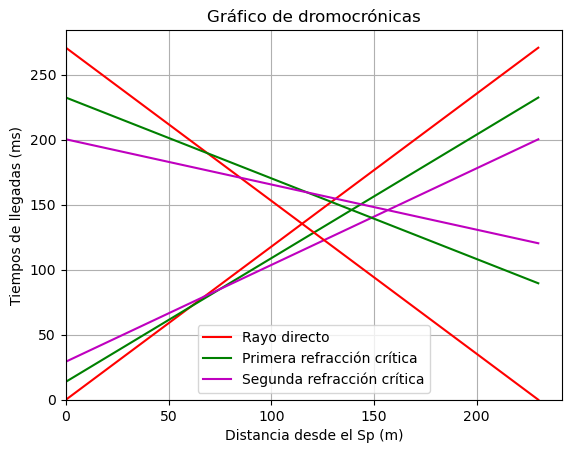

In [ ]:
x = np.linspace(0, 230, 400)
x1 = x[::-1]
y1D = funcion_OdirectaD(x)
y2D = funcion_Critica_1D(x)
y3D = funcion_Critica_2D(x)
y1U = funcion_OdirectaU(x1)
y2U = funcion_Critica_1U(x1)
y3U = funcion_Critica_2U(x1)
plt.plot(x,y1D, 'r-',label='Rayo directo')
plt.plot(x,y2D, 'g-',label='Primera refracción crítica')
plt.plot(x,y3D, 'm-',label='Segunda refracción crítica')
plt.plot(x,y1U, 'r-',)
plt.plot(x,y2U, 'g-',)
plt.plot(x,y3U, 'm-',)
plt.title('Gráfico de dromocrónicas')
plt.xlabel('Distancia desde el Sp (m)')
plt.ylabel('Tiempos de llegadas (ms)')
plt.legend()
plt.grid(True)
plt.xlim(left=0)
plt.ylim(bottom=0)

<h4> Conclusiones:</h4>
<h4> El gráfico revela la presencia de una capa oculta, identificada como la capa 2, ya que se puede apreciar cómo la segunda refracción crítica opaca a la primera. Esta observación sugiere que la capa 2 es delgada, como se muestra en el gráfico adjunto para una representación visual más clara </h4>

<ul>
    <li><h3>Se presenta un esquema representativo de los resultados obtenidos</li></h3>

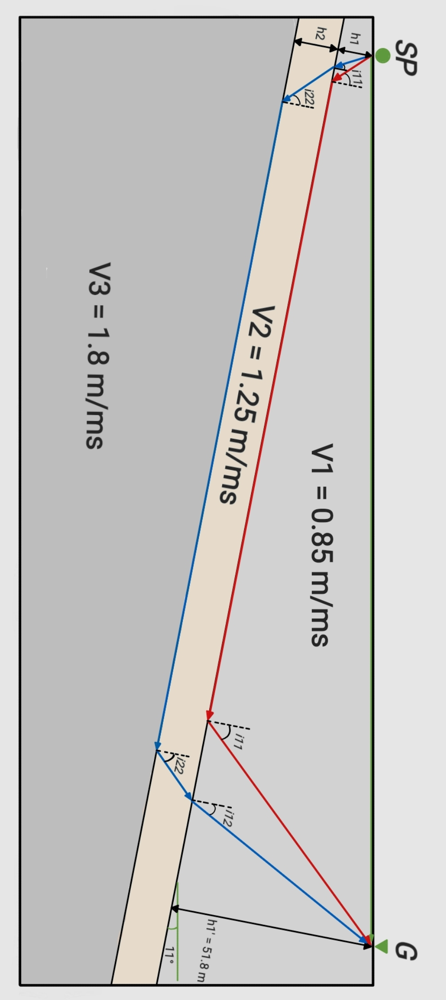

In [ ]:
Image(filename="D:\descargas\Geofisica_T1_P3.jpg")

<h3> Punto 4 </h3>

<ul>
    <li><h4> Se defienen los datos de la tabla proporcionada</h4></li>

In [11]:
datos = {'Distancia':[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120],
         'Perfil':[33.6, 66.7, 100, 111.4, 114.3, 117.3, 120.2, 123.1, 133.6, 138.9, 144.1, 149.4],
         'Contraperfil':[33.3, 66.7, 100, 119.8, 125.1, 134.1, 137, 140, 142.9, 145.8, 148.8, 151.7]}
df = pd.DataFrame(datos)
df['Dcontraperfil'] = [max(df['Distancia'])+10 - x for x in df['Distancia']]
df = df.round(1)
print(df)

    Distancia  Perfil  Contraperfil  Dcontraperfil
0          10    33.6          33.3            120
1          20    66.7          66.7            110
2          30   100.0         100.0            100
3          40   111.4         119.8             90
4          50   114.3         125.1             80
5          60   117.3         134.1             70
6          70   120.2         137.0             60
7          80   123.1         140.0             50
8          90   133.6         142.9             40
9         100   138.9         145.8             30
10        110   144.1         148.8             20
11        120   149.4         151.7             10


<ul>
    <li><h4> Se realiza el gráfico correspondiente a los valores experimentales </h4></li>

(0.0, 157.61999999999998)

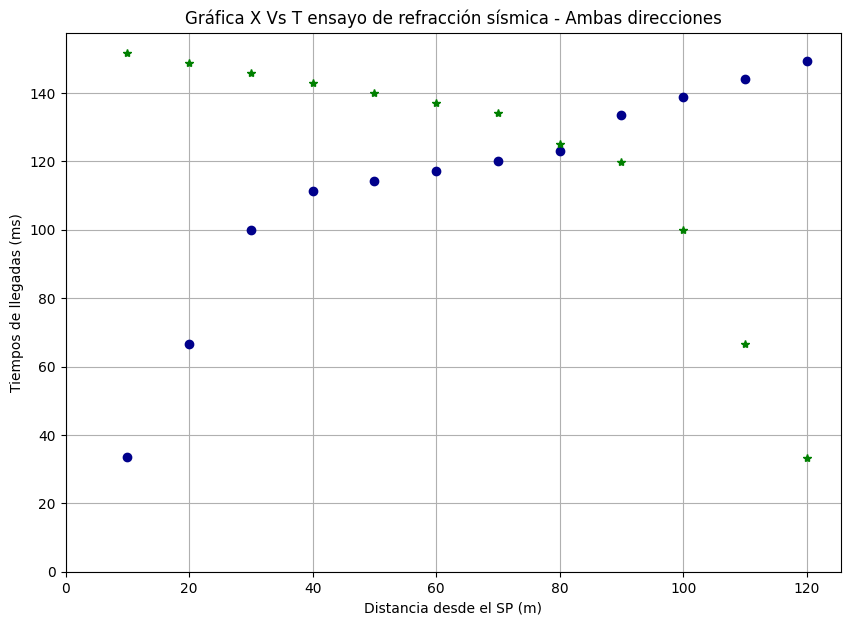

In [12]:
plt.figure(figsize=(10,7))
plt.plot(df['Distancia'], df['Perfil'], 'o', color='darkblue')
plt.plot(df['Dcontraperfil'], df['Contraperfil'], '*', color='green')
plt.title('Gráfica X Vs T ensayo de refracción sísmica - Ambas direcciones')
plt.xlabel('Distancia desde el SP (m)')
plt.ylabel('Tiempos de llegadas (ms)')
plt.grid(True)
plt.xlim(left=0)
plt.ylim(bottom=0)

<ul>
    <li><h4> Se realiza la regresion lineal y la gráfica correspondientes </h4></li>

(0.0, 157.6305)

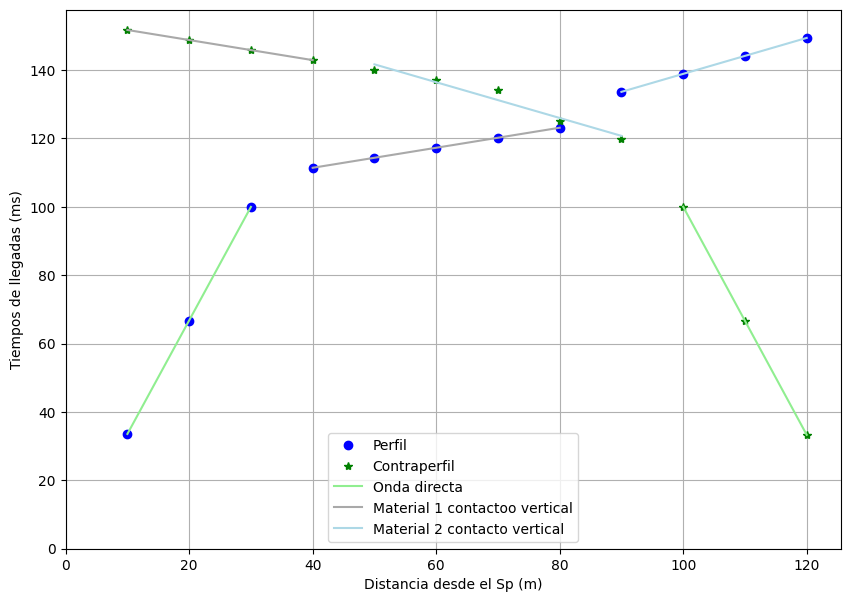

In [13]:
intP_1 = (0,2)
intP_2 = (3, 7)
intP_3 = (8, 11)
intC_1 = list(range(0,3))
intC_2 = list(range(3,8))
intC_3 = list(range(8,12))
Columnas = ['Contraperfil','Dcontraperfil']
DinterP_1 = df.iloc[intP_1[0]:intP_1[1]+1]
DinterP_2 = df.iloc[intP_2[0]:intP_2[1]+1]
DinterP_3 = df.iloc[intP_3[0]:intP_3[1]+1]
DinterC_1 = df.iloc[intC_1, df.columns.isin(Columnas)]
DinterC_2 = df.iloc[intC_2, df.columns.isin(Columnas)]
DinterC_3 = df.iloc[intC_3, df.columns.isin(Columnas)]
slope_1P, intercept_1P, r_value, p_value, std_err = linregress(DinterP_1['Distancia'], DinterP_1['Perfil'])
slope_2P, intercept_2P, r_value, p_value, std_err = linregress(DinterP_2['Distancia'], DinterP_2['Perfil'])
slope_3P, intercept_3P, r_value, p_value, std_err = linregress(DinterP_3['Distancia'], DinterP_3['Perfil'])
slope_1C, intercept_1C, r_value, p_value, std_err = linregress(DinterC_1['Dcontraperfil'], DinterC_1['Contraperfil'])
slope_2C, intercept_2C, r_value, p_value, std_err = linregress(DinterC_2['Dcontraperfil'], DinterC_2['Contraperfil'])
slope_3C, intercept_3C, r_value, p_value, std_err = linregress(DinterC_3['Dcontraperfil'], DinterC_3['Contraperfil'])
plt.figure(figsize = (10,7))
plt.plot(df['Distancia'], df['Perfil'], 'o', color='blue', label='Perfil')
plt.plot(df['Dcontraperfil'],df['Contraperfil'], '*',color='green', label = 'Contraperfil')
plt.plot(DinterP_1['Distancia'], slope_1P * DinterP_1['Distancia']+ intercept_1P, color= 'lightgreen', label='Onda directa')
plt.plot(DinterP_2['Distancia'], slope_2P * DinterP_2['Distancia']+ intercept_2P, color= 'darkgray', label='Material 1 contactoo vertical')
plt.plot(DinterP_3['Distancia'], slope_3P * DinterP_3['Distancia']+ intercept_3P, color='lightblue', label= 'Material 2 contacto vertical')
plt.plot(DinterC_1['Dcontraperfil'], slope_1C * DinterC_1['Dcontraperfil']+ intercept_1C, color='lightgreen')
plt.plot(DinterC_2['Dcontraperfil'], slope_2C * DinterC_2['Dcontraperfil']+ intercept_2C, color = 'lightblue')
plt.plot(DinterC_3['Dcontraperfil'], slope_3C * DinterC_3['Dcontraperfil']+ intercept_3C, color='darkgray' )
plt.xlabel('Distancia desde el Sp (m)')
plt.ylabel('Tiempos de llegadas (ms)')
plt.legend()
plt.grid(True)
plt.xlim(left=0)
plt.ylim(bottom=0)

<ul>
<li><h4> Se corre un código que evalua la relación entre las pendientes en la gráfica para asegurar que se trate (o no) de una capa vertical </h4></li>

In [14]:
condiciones_cumplidas = []
if abs(slope_2P) > abs(slope_1P):
    condiciones_cumplidas.append("slope_2P > slope_1P")
if abs(slope_2C) > abs(slope_1C):
    condiciones_cumplidas.append("slope_2C > slope_1C")
if abs(slope_3P) > abs(slope_2P):
    condiciones_cumplidas.append("slope_3P > slope_2P")
if abs(slope_3C) > abs(slope_2C):
    condiciones_cumplidas.append("slope_3C > slope_2C")

if condiciones_cumplidas:
    mensaje_html = '<div style="font-size:16px; font-weight:bold;">El contacto es vertical</div>'
    display(HTML(mensaje_html))
    for condicion in condiciones_cumplidas:
        print(f"Condición cumplida: {condicion}")
else:
    print("No se cumple ninguna condición específica.")

mensaje_html_resumen = f'''
<div style="color: black; font-size: 16px; font-weight: bold;">
    <p> Las pendientes utilizadas son: </p>
</div>
<div style="color: black; font-size: 12px">
    <p>La pendiente 1 perfil es {abs(slope_1P):.2f}</p>
    <p>La pendiente 2 perfil es {abs(slope_2P):.2f}</p>
    <p>La pendiente 3 perfil es {abs(slope_3P):.2f}</p>
    <p>La pendiente 1 contraperfil es {abs(slope_1C):.2f}</p>
    <p>La pendiente 2 contraperfil es {abs(slope_2C):.2f}</p>
    <p>La pendiente 3 contraperfil es {abs(slope_3C):.2f}</p>
</div>
'''
display(HTML(mensaje_html_resumen))


Condición cumplida: slope_3P > slope_2P


<ul>
    <li><h4> Finalmente se calculan las velocidades y el espesor del estrato </h4></li>

In [17]:
mensaje_html = f'''
<div style = "color: black; font-size: 16px;">
    <p> Se calculan con perfil y contraperfil velocidades y ángulo de incidencia para confirmar datos coherentes </p>
</div>
'''
display(HTML(mensaje_html))

V1 = 1/(slope_1P)
V2 = 1/(slope_2P)
V3 = 1/(slope_3P)
V1c = 1/(abs(slope_1C))
V2c = 1/(abs(slope_3C))
V3c = 1/(abs(slope_2C))
ic = math.asin(V1/V2)
icc = math.asin(V1c/V2c)
ic2 = math.asin(V1/V3)
icc2 = math.asin(V1c/V3c)
Cosic = math.cos(ic)
Cosic2 = math.cos(ic2)
h1=(intercept_2P*V1)/(2*Cosic)
h1d=(intercept_2P*V1)/(2*Cosic2)
ic_grados = math.degrees(ic)
icc_grados = math.degrees(icc)
ic_grados2 = math.degrees(ic2)
icc_grados2 = math.degrees(icc2)
mensaje_html = f'''
<div style="color: black; font-size: 16px;">
    <p>El espesor del estrato es {h1:.2f} m teniendo en cuenta la velocidad del medio de la izquierda y {h1d:.2f} m si se tiene en cuenta el que la derecha</p>
    <p>La velocidad del estrato 1 en perfil es {V1:.2f} m/ms y en contraperfil {V1c:.2f} m/ms </p>
    <p>La velocidad del material a la izquierda del contacto vertical en perfil es {V2:.2f} m/ms y en contraperfil {V2c:.2f} m/ms</p>
    <p>La velocidad del material a la derecha del contacto vertical en perfil es {V3:.2f} m/ms y en contraperfil {V3c:.2f} m/ms</p>
    <p>El ángulo de incidencia con la velocidad del material de la izquierda en perfil es {ic_grados:.2f}º y en contraperfil es {icc_grados:.2f}º </p>
    <p>El ángulo de incidencia con la velocidad del material de la derecha en perfil es {ic_grados2 :.2f}º y en contraperfil es {icc_grados2:.2f}º </p>
</div>
'''
display(HTML(mensaje_html))

<ul>
    <li><h4> Se muestra un esquema representatitivo de los resultados</li></h4>

In [ ]:
Image(filename="D:\\Respaldo\\2024-1\\GEOFISICA\\geofisica4.jpg")

<h4> Conclusiones:</h4>
<h5> Debido a la relación entre las pendientes en las regresiones lineales se interpreta como un contacto vertical suprayaciendo una capa horizontal. Debido a que en el estrato inferior se encuentran 2 medios con propiedades distintas, se tomaron todas las variables posibles para calcular los datos necesarios, es decir, se calculan el espesor y el ángulo de incidencia asumiendo como el medio de abajo el material de la derecha o el de la izquierda, por ende resultan 2 espesores probables y dos angulos de incidencia probables, adicionalmente para las velocidades se calculan en perfil y en contra perfil para asegurarse que los datos son coherentes, teniendo en cuenta que al ir en perfil se encuentra primero el material de la izquierda y en contraperfil se encontraria primero el material de la derecha, asi pues, en las gráficas de regresión las pendientes estan invertidas en perfil y contraperfil.</h5>